In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Mobile-Net Model

Step 1

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image

# === USER VARIABLES ===

# Path to your dataset folder organized by class subfolders
#DATASET_DIR = 'dataset/'  # Change to your dataset path
DATASET_DIR = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/train_data'
# Image input size and batch size for training
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 123  # For deterministic shuffling/splitting

# === STEP 1: Load dataset and split into train/validation ===

print("Loading dataset with 80/20 train-validation split...")
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes found: {class_names}")

Loading dataset with 80/20 train-validation split...
Found 128 files belonging to 3 classes.
Using 103 files for training.
Found 128 files belonging to 3 classes.
Using 25 files for validation.
Classes found: ['Species1', 'Species2', 'Species3']


Step1_Explanation: This code imports the required libraries for building and training the model. It defines dataset path, image size, batch size, and a value for consistent results. The dataset is loaded from the directory. The class names are identified, and the total number of categories is calculated for use in the model.

Step 2

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

Step 3

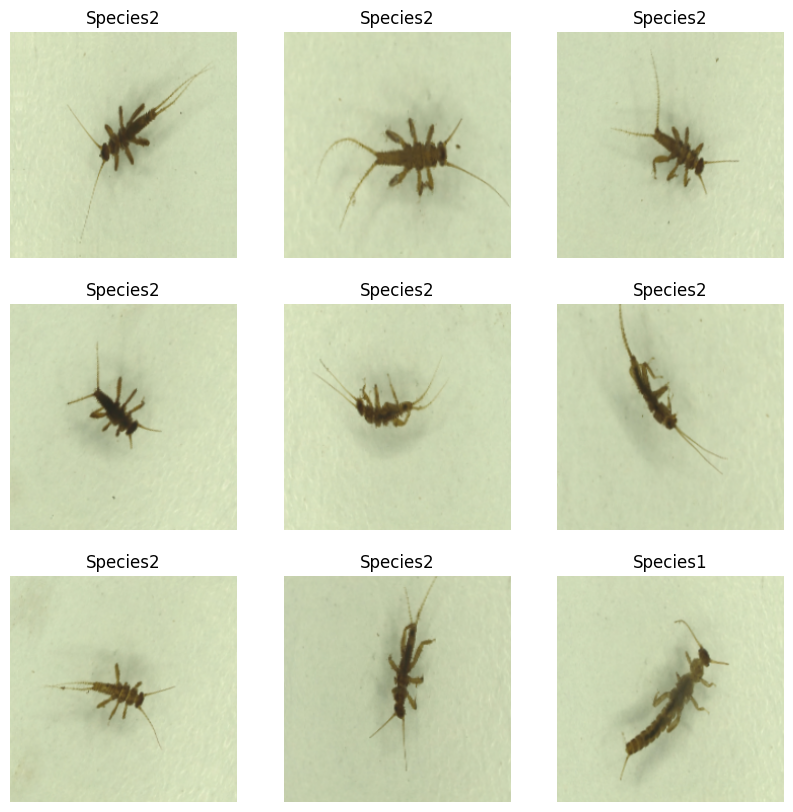

In [ ]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Visualize some augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented_images = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

Step3_Explanation: The code creates a data layer that flips, rotates, and zooms images to increase dataset variety. The code then applies these changes to a sample batch of images from the training dataset. It displays the augmented images in a grid for visual inspection.

Step 4

In [ ]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False  # Freeze the base model initially

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,261,827 (8.63 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Step4_Explanation: Step 4 loads the MobileNetV2 model and uses it as a base for the new model. New layers are added to help classify the images.

Step 5

In [ ]:
EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 4s/step - accuracy: 0.6019 - loss: 0.9159 - val_accuracy: 0.8400 - val_loss: 0.6175
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.7767 - loss: 0.6555 - val_accuracy: 0.8400 - val_loss: 0.4764
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.7767 - loss: 0.6003 - val_accuracy: 0.8400 - val_loss: 0.4017
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.7573 - loss: 0.5585 - val_accuracy: 0.8400 - val_loss: 0.3658
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.8447 - loss: 0.4508 - val_accuracy: 0.8400 - val_loss: 0.3912
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.8447 - loss: 0.4222 - val_accuracy: 0.8400 - val_loss: 0.3658
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.8835 - loss: 0.3834 - val_accuracy: 0.8400 - val_loss: 0.3014
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9320 - loss: 0.2864 - val_accuracy: 0.8400 - val_loss: 0.2558
Epoch 9/10
4/4

Step5_Explanation: This trains the model using the training dataset over 10 epochs. It also checks perfomrance on the validation dataset. The results are stored in history for later use.

Step 6

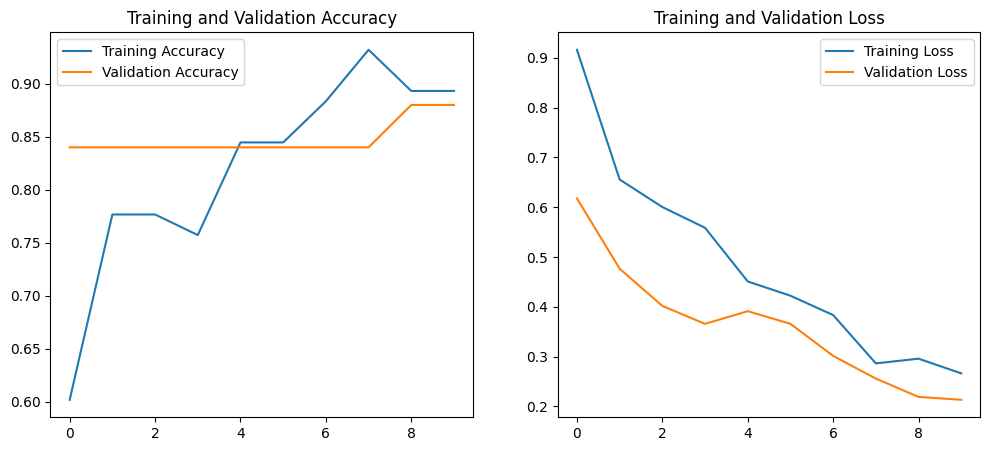

In [ ]:
# Re-extracting from history to ensure correct length for initial EPOCHS
initial_acc = history.history['accuracy']
initial_val_acc = history.history['val_accuracy']
initial_loss = history.history['loss']
initial_val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, initial_acc, label='Training Accuracy')
plt.plot(epochs_range, initial_val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, initial_loss, label='Training Loss')
plt.plot(epochs_range, initial_val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

Step6_Explanation:The code presents the accuracy and loss values from the training results and plots graphs to show how the model performed over each epoch. Once graph shows training vs validation accuracy, and the other shows training vs validation loss.

Step 7

In [ ]:
val_loss, val_acc = model.evaluate(val_ds)
print(f'Validation accuracy: {val_acc*100:.2f}%')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.8800 - loss: 0.2134
Validation accuracy: 88.00%


Step7_Explanation:This line runs the model on the validation dataset to measure how well it performs. It returns two numbers: alidation loss (how wrong the model is) and validation accuracy (how often it predicts correctly).

Step 9

In [ ]:
%cd /content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab
model.save('macroinvertebrates_classifier.h5')
print("Model saved as 'macroinvertebrates_classifier.h5'")

/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab
Model saved as 'macroinvertebrates_classifier.h5'


Step9_Explanation:  A macroinvertebrates_classifier.h5 file is saved, as this file contains the model architecture, weights, and training configuration.

Step 10

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


<Figure size 1200x1200 with 0 Axes>

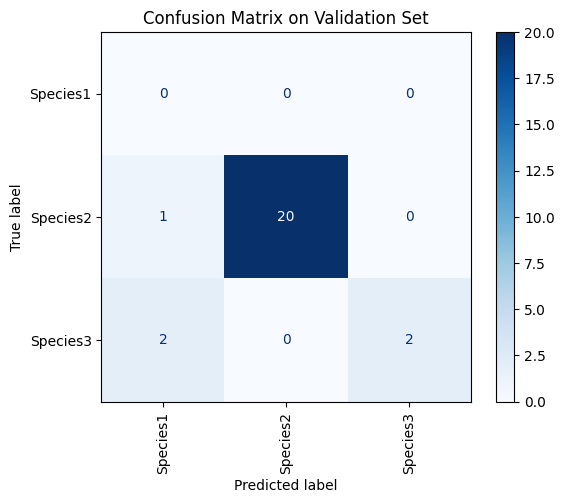

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Weighted Precision: 1.0000
Weighted Recall:    0.8800
Weighted F1-score:  0.9262


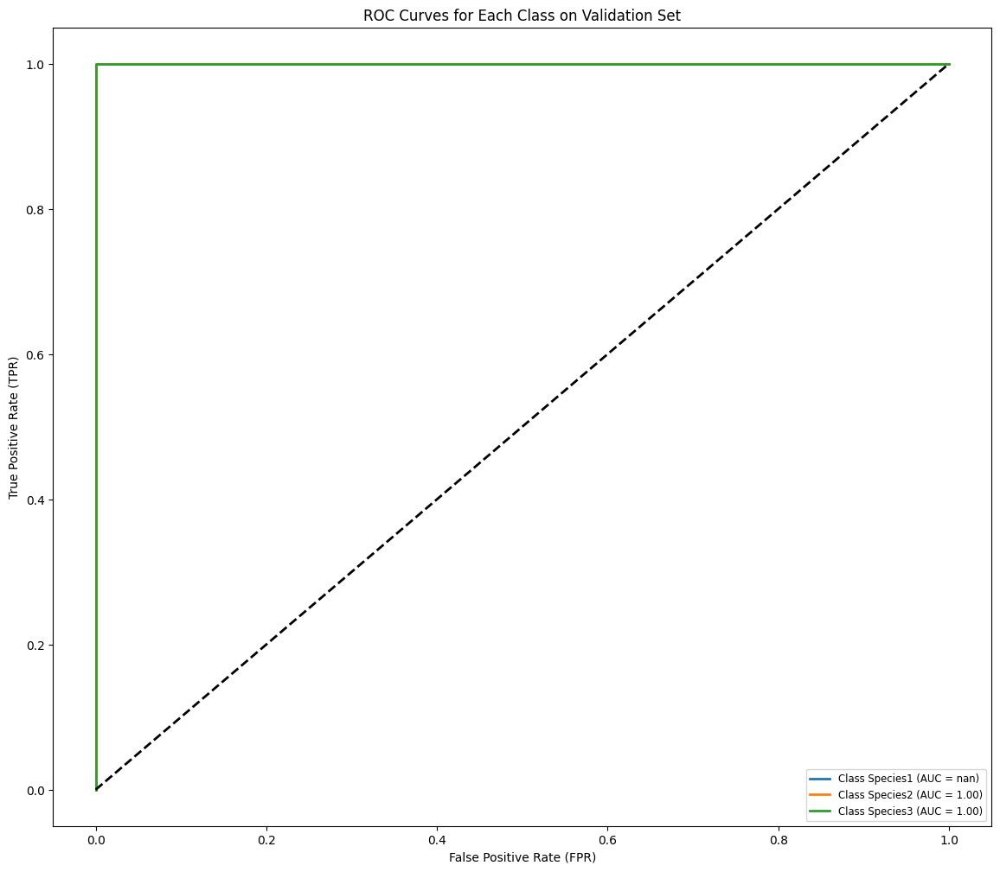

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf
import os

# Step 10.1: Aggregate predictions and true labels from validation dataset
y_true = []
y_pred = []
y_scores = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_scores.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_scores = np.array(y_scores)

# Step 10.2: Confusion Matrix Plot
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(12,12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix on Validation Set')
plt.show()

# Step 10.3: Precision, Recall, F1-score (weighted average)
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'
)
print(f"Weighted Precision: {precision:.4f}")
print(f"Weighted Recall:    {recall:.4f}")
print(f"Weighted F1-score:  {f1:.4f}")

# Step 10.4: Multi-class ROC curves and AUC

# Binarize the labels for multi-class ROC
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'Class {class_names[i]} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curves for Each Class on Validation Set")
plt.legend(loc="lower right", fontsize='small')
plt.show()

Step10_Explanation:The code checks how well the model performs with its predictions from the validation set. After collecting all the predictions, it creates a confusion matrix to show which classes were predicted. Then calculates precision, recall, and F1‑score, measures of how reliable the model is.

It draws curves for each class to show how well the model seperates the species.


Step 12

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: species1_1.png --> Predicted: Species2 (49.35%)


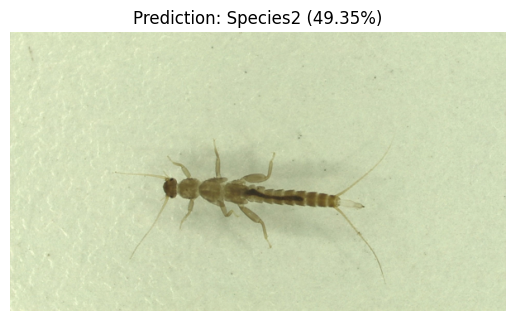

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Original Image: species1_2.png --> Predicted: Species2 (49.95%)


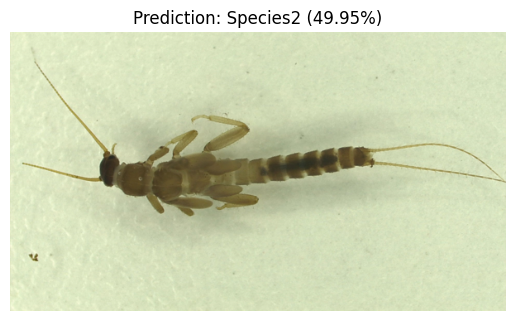

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Original Image: species1_3.png --> Predicted: Species2 (50.23%)


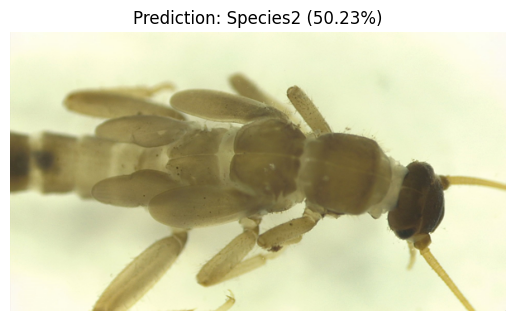

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Original Image: species1_4.png --> Predicted: Species2 (50.10%)


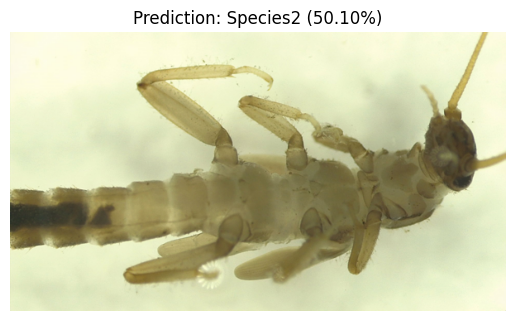

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Original Image: species1_5.png --> Predicted: Species2 (49.58%)


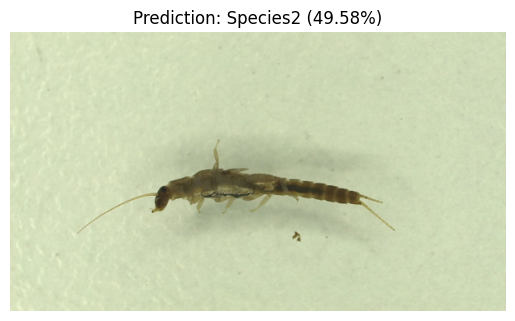

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Original Image: species2_1.png --> Predicted: Species2 (50.46%)


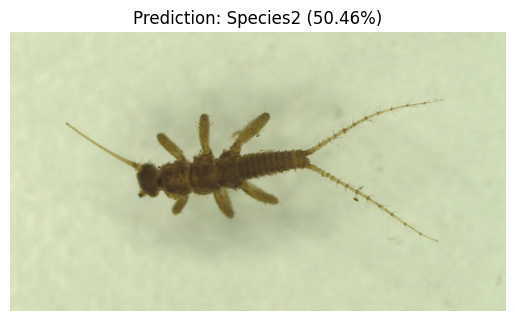

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Original Image: species2_2.png --> Predicted: Species2 (50.03%)


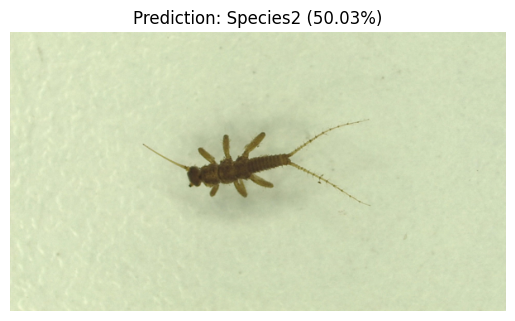

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Original Image: species2_3.png --> Predicted: Species2 (49.79%)


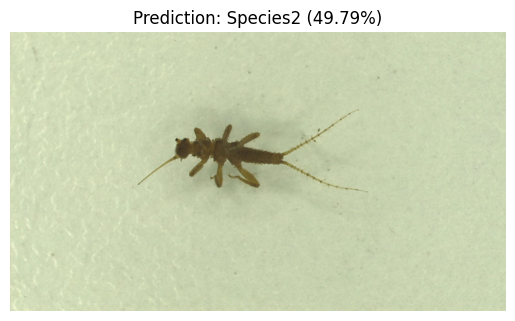

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
Original Image: species2_4.png --> Predicted: Species2 (51.20%)


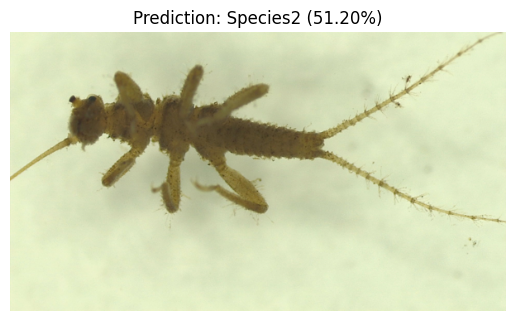

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
Original Image: species2_5.png --> Predicted: Species2 (50.07%)


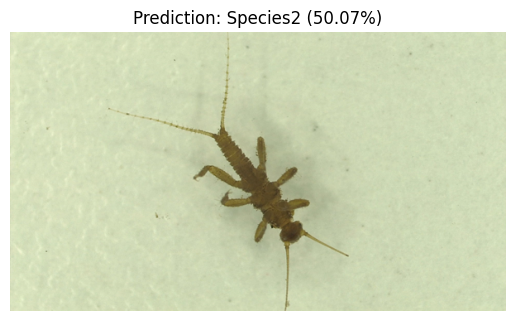

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
Original Image: species3_1.png --> Predicted: Species2 (49.30%)


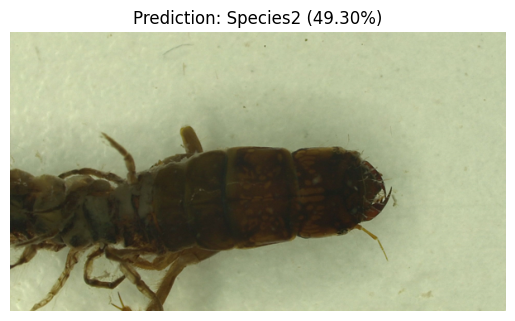

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
Original Image: species3_2.png --> Predicted: Species2 (49.10%)


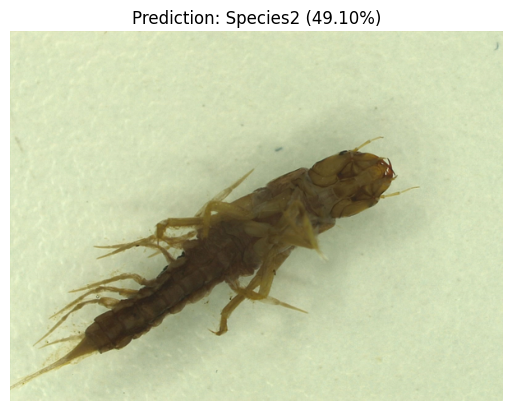

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
Original Image: species3_3.png --> Predicted: Species2 (49.81%)


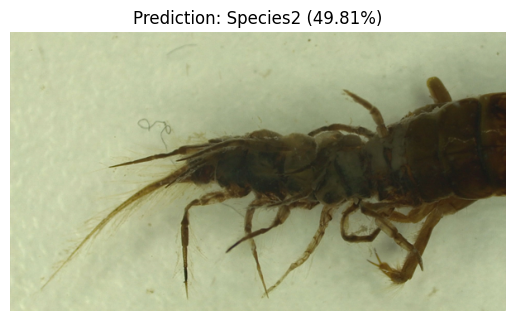

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
Original Image: species3_4.png --> Predicted: Species2 (51.25%)


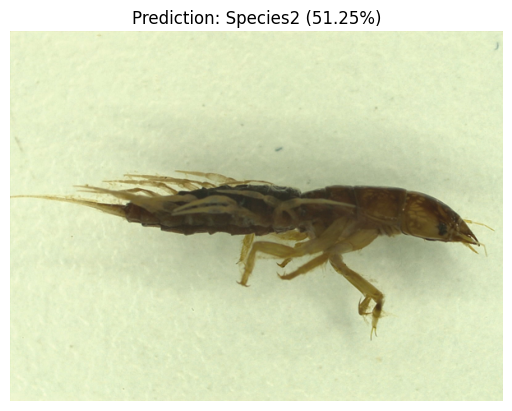

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
Original Image: species3_5.png --> Predicted: Species2 (49.42%)


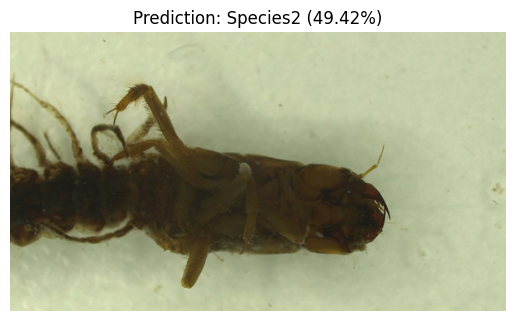

In [ ]:
#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)

Step12_Explanation: In this code, the images are loaded from the test_images folder and prepares each one so the model can read it. For every image, the model makes a prediction about which species it thinks it is. The code then prints the predicted class and shows the image with the prediction written above it.

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


2. EfficientNet Model

In [8]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
import os

In [9]:
DATASET_DIR = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/train_data'

In [10]:
IMG_SIZE = (224, 224)        # EfficientNetB0 default input size
BATCH_SIZE = 32
SEED = 123

Step 1

In [11]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print("Classes:", class_names)

Found 128 files belonging to 3 classes.
Using 103 files for training.
Found 128 files belonging to 3 classes.
Using 25 files for validation.
Classes: ['Species1', 'Species2', 'Species3']


Step 2

In [12]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

Step 3

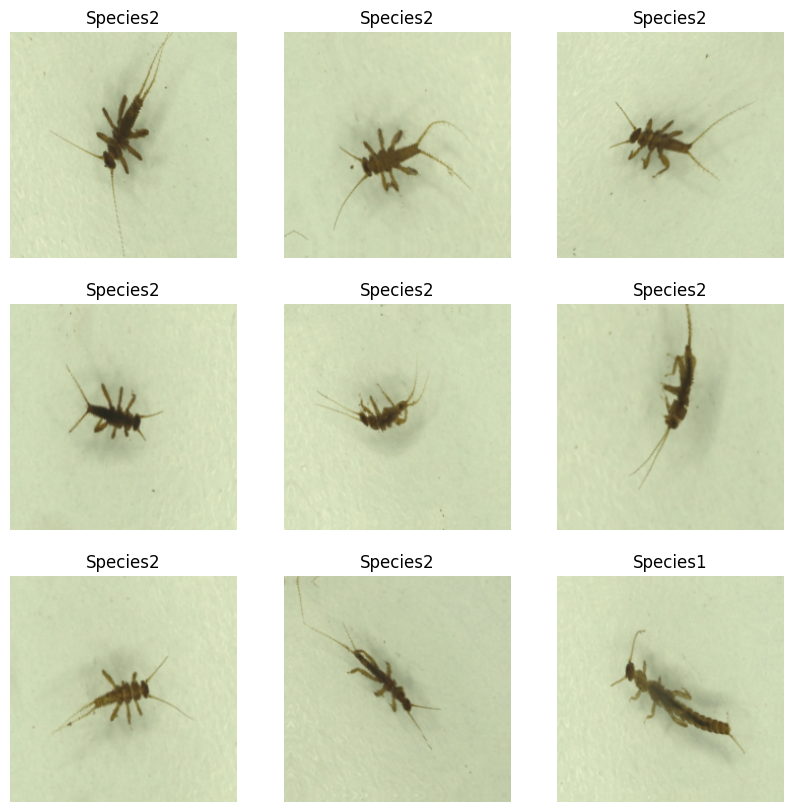

In [13]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Optional: visualize augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(augmented[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

Step 4

In [14]:
base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # freeze base

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)               # apply augmentation
x = tf.keras.applications.efficientnet.preprocess_input(x)  # preprocess as EfficientNet expects
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)
model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,053,414 (15.46 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

Step4_Explanation: Step 4 is different from the MobileNet version as it uses EficientNet as the base model.  In this step, the code loads EfficientNetB0 with ImageNet weights, removes the original classifier, and freezes the base model so only the new layers will train. This structure allows the model to learn high‑level features from EfficientNet.

Step 5

In [15]:
EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.7087 - loss: 0.7814 - val_accuracy: 0.8400 - val_loss: 0.4960
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.7864 - loss: 0.5375 - val_accuracy: 0.8400 - val_loss: 0.3999
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.7864 - loss: 0.4748 - val_accuracy: 0.8400 - val_loss: 0.3718
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.7767 - loss: 0.4495 - val_accuracy: 0.8400 - val_loss: 0.3401
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.8155 - loss: 0.3543 - val_accuracy: 0.8800 - val_loss: 0.3390
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.8641 - loss: 0.3442 - val_accuracy: 0.9200 - val_loss: 0.3438
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9029 - loss: 0.3155 - val_accuracy: 0.8800 - val_loss: 0.3378
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9223 - loss: 0.3039 - val_accuracy: 0.8800 - val_loss: 0.3206
Epoch 9/10
4

Step 6

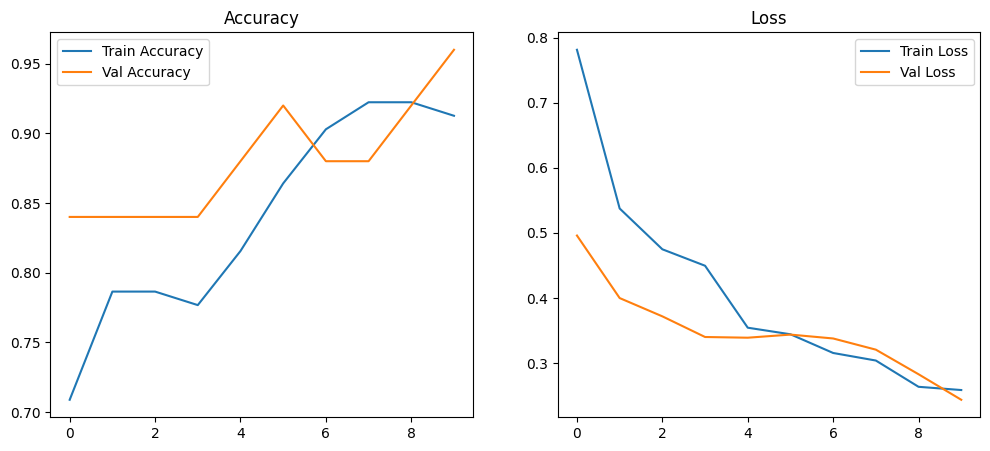

In [16]:
acc, val_acc = history.history['accuracy'], history.history['val_accuracy']
loss, val_loss = history.history['loss'], history.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss')

plt.show()

Step 7

Epoch 10/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 67s 6s/step - accuracy: 0.3398 - loss: 1.3086 - val_accuracy: 1.0000 - val_loss: 0.2321
Epoch 11/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 5s/step - accuracy: 0.3010 - loss: 1.3002 - val_accuracy: 1.0000 - val_loss: 0.2306
Epoch 12/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 20s 4s/step - accuracy: 0.3204 - loss: 1.2028 - val_accuracy: 1.0000 - val_loss: 0.2291
Epoch 13/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 22s 5s/step - accuracy: 0.3107 - loss: 1.2008 - val_accuracy: 1.0000 - val_loss: 0.2294
Epoch 14/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 0.3301 - loss: 1.1759 - val_accuracy: 1.0000 - val_loss: 0.2283
Epoch 15/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 5s/step - accuracy: 0.3981 - loss: 1.0854 - val_accuracy: 1.0000 - val_loss: 0.2277
Epoch 16/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 37s 5s/step - accuracy: 0.4660 - loss: 1.0871 - val_accuracy: 1.0000 - val_loss: 0.2270
Epoch 17/20
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 5s/step - accuracy: 0.4466 - loss: 1.0485 - val_accuracy: 1.0000 - val_loss: 0.2264


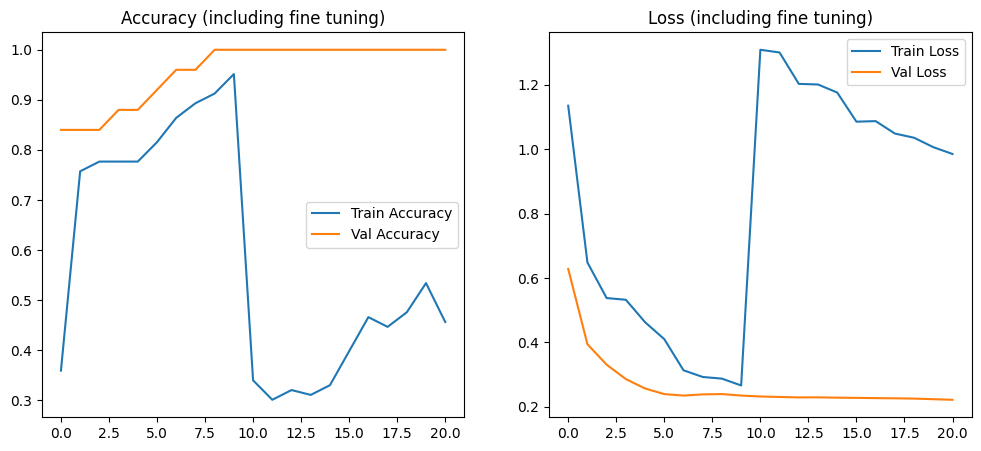

In [ ]:
base_model.trainable = True

# Freeze initial layers, train last layers of EfficientNet
fine_tune_at = 100  # Freeze all layers before this
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1]
)

# Plot fine-tuning results (optional)
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']
loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy (including fine tuning)')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss (including fine tuning)')

plt.show()

Step7_Explanation: Step 7 is different from the MobileNet workflow because EfficientNet includes another stage. This allows the model to adjust specialised features to my dataset. The learning rate is set extremely low so the model updates slowly. The output shows that the training accuracy dropping at first but validation accuracy staying high.

Step 8

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


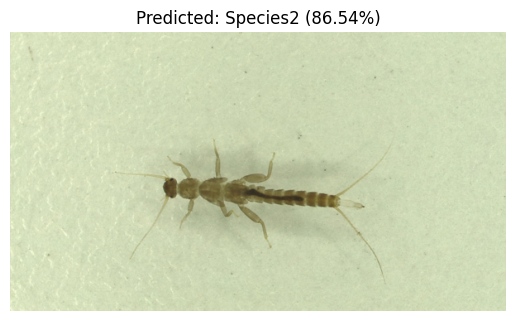

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence

# Example usage:
test_img_path = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/test_data/species1_1.png'
predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence * 100:.2f}%)')
plt.axis('off')
plt.show()

Step8_Explanation:Step 8 uses the trained EfficientNet model to make predictions on new images that are not part of the training or validation sets. The output for this code is it runs the model to predict which insect species the image belongs to and prints the predicted class along with the confidence score.

Step 9

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


<Figure size 1200x1200 with 0 Axes>

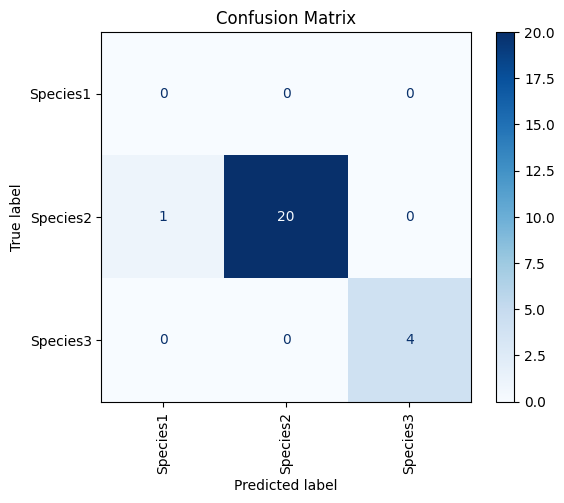

Precision: 1.0000
Recall:    0.9600
F1-score:  0.9795


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


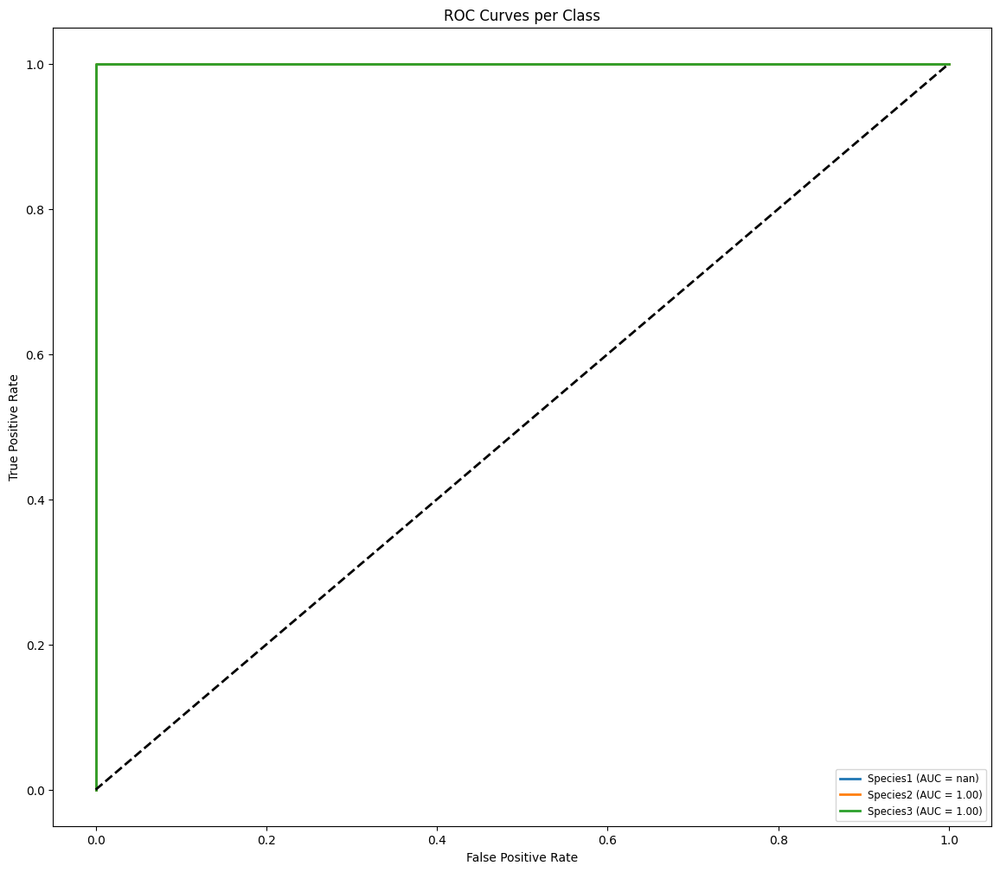

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()

Step 12

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
Original Image: species1_1.png --> Predicted: Species1 (36.97%)


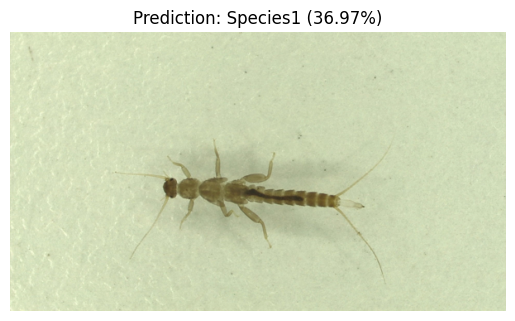

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
Original Image: species1_2.png --> Predicted: Species1 (36.96%)


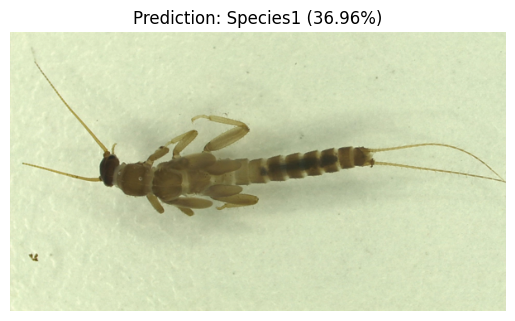

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
Original Image: species1_3.png --> Predicted: Species1 (36.95%)


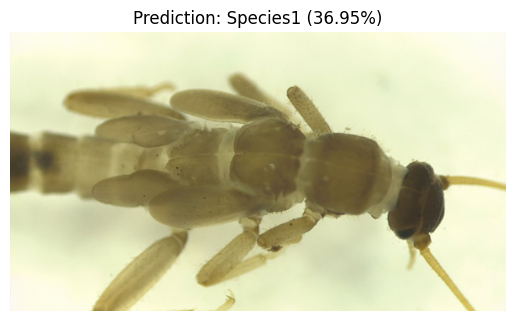

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
Original Image: species1_4.png --> Predicted: Species1 (36.97%)


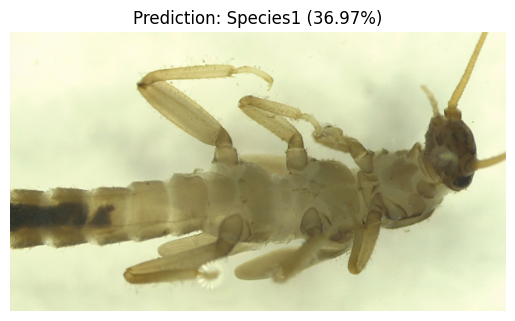

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Original Image: species1_5.png --> Predicted: Species1 (36.96%)


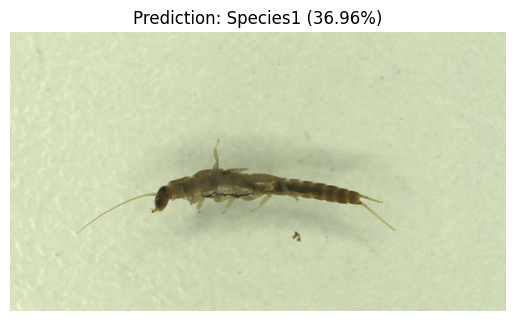

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Original Image: species2_1.png --> Predicted: Species1 (36.96%)


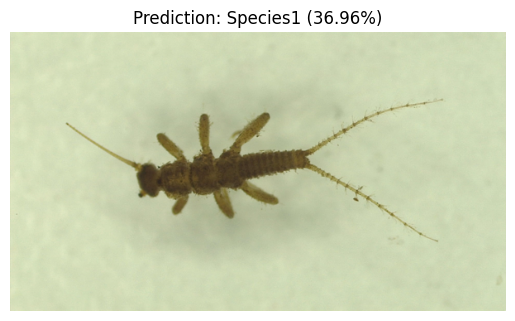

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
Original Image: species2_2.png --> Predicted: Species1 (36.96%)


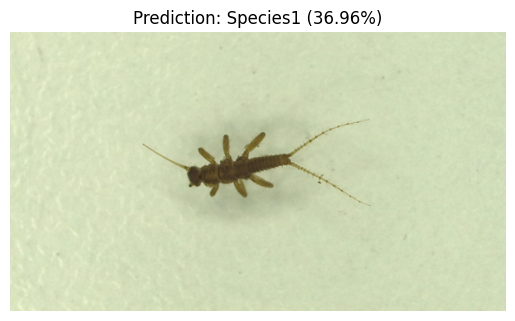

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step
Original Image: species2_3.png --> Predicted: Species1 (36.97%)


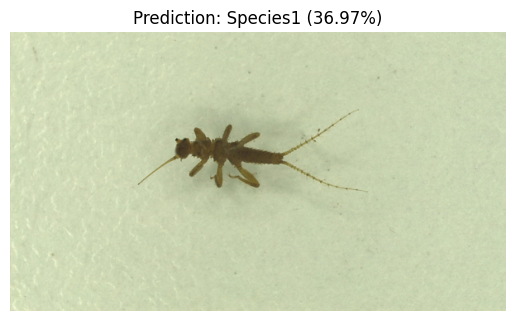

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Original Image: species2_4.png --> Predicted: Species1 (36.94%)


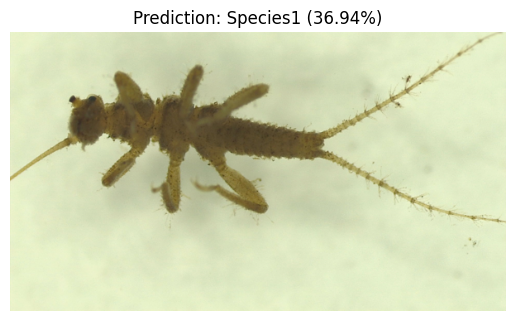

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
Original Image: species2_5.png --> Predicted: Species1 (36.97%)


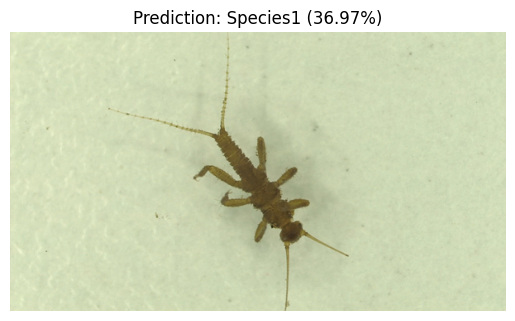

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
Original Image: species3_1.png --> Predicted: Species1 (36.99%)


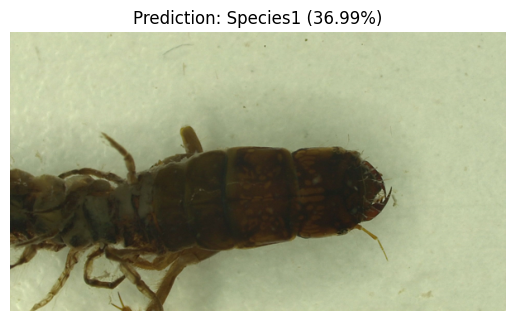

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
Original Image: species3_2.png --> Predicted: Species1 (36.97%)


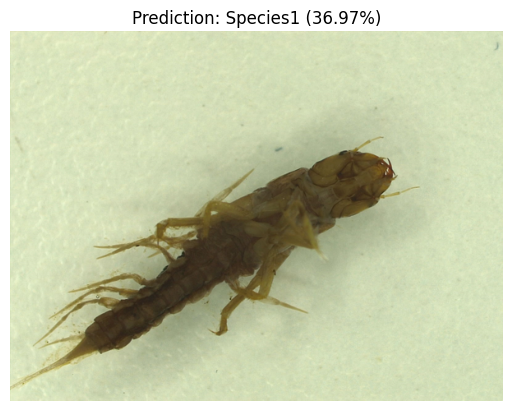

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
Original Image: species3_3.png --> Predicted: Species1 (36.96%)


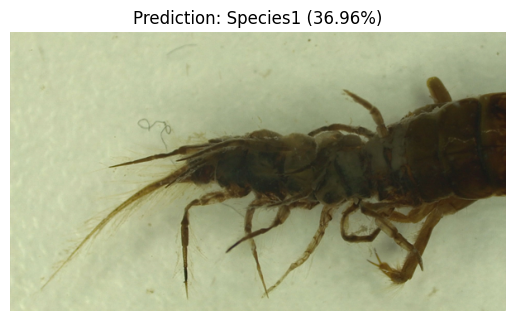

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
Original Image: species3_4.png --> Predicted: Species1 (36.97%)


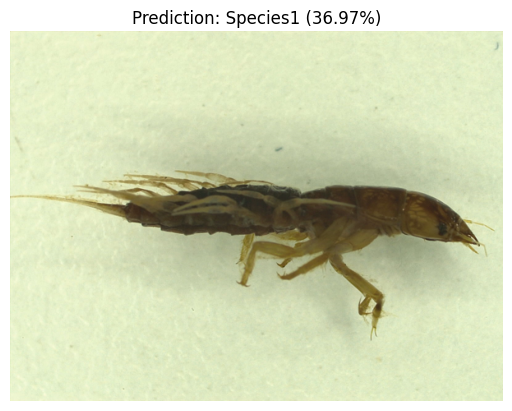

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
Original Image: species3_5.png --> Predicted: Species1 (36.97%)


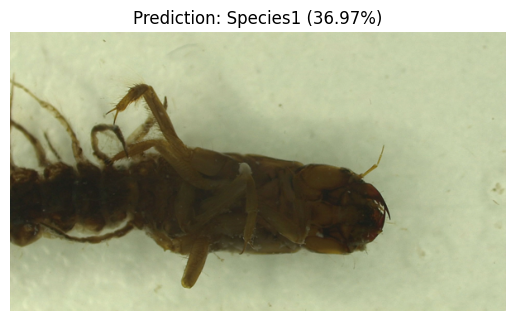

In [ ]:
#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)

3. Vision Transformer Model

In [18]:
#!pip install tensorflow tensorflow-hub tensorflow-datasets matplotlib

This command instals all the libraries needed to run the Vision Transformer model. It installs TensorFlow for building and training the model, TensorFlow Hub for loading, and TensorFlow datasets for handling dataset utilities. It also installs Matplotlib, used to display images and graphs during training and evaluation.


In [19]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import os

In [20]:
# === User parameters ===
DATASET_DIR = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/train_data'
IMG_SIZE = 224            # ViT input size
BATCH_SIZE = 32
SEED = 123
EPOCHS = 10

Step 1

In [21]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='training',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='validation',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes: {class_names}")

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

Found 128 files belonging to 3 classes.
Using 103 files for training.
Found 128 files belonging to 3 classes.
Using 25 files for validation.
Classes: ['Species1', 'Species2', 'Species3']


Step 2

In [22]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

Step 3

In [23]:
vit_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_layer = hub.KerasLayer(vit_url, trainable=False)

Step 4

In [24]:
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# Data augmentation
x = data_augmentation(inputs)

# The TF Hub ViT module expects pixel values in [0, 255].
# image_dataset_from_directory typically outputs float32 in [0, 255],
# and data_augmentation maintains this. So, no explicit [0,1] scaling is needed here.

# ViT feature extractor
# Wrap the vit_layer call in a Lambda layer to ensure proper symbolic tensor handling
features = tf.keras.layers.Lambda(lambda y: vit_layer(y))(x);

# Classification head
outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(features)

model = tf.keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

Step4_Explanation: Step 4 is different from the MobileNet and EfficientNet models because it loads loads a pretrained Vision Transformer model from TensorFlow Hub. This makes the architecture fundamentally different, as it relies on attention mechanisms to learn relationships. The output confirms that the model has been successfully loaded from the TF‑Hub URL and is ready to be used as a feature.


Step 5

In [26]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 93s 21s/step - accuracy: 0.4660 - loss: 1.2594 - val_accuracy: 0.8400 - val_loss: 0.8435
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 61s 15s/step - accuracy: 0.7767 - loss: 0.9930 - val_accuracy: 0.8400 - val_loss: 1.2081
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 90s 18s/step - accuracy: 0.7767 - loss: 1.0542 - val_accuracy: 0.8400 - val_loss: 1.3459
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 82s 18s/step - accuracy: 0.7767 - loss: 1.0378 - val_accuracy: 0.8400 - val_loss: 1.0033
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 69s 18s/step - accuracy: 0.7767 - loss: 0.8878 - val_accuracy: 0.8400 - val_loss: 0.7092
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 86s 18s/step - accuracy: 0.7767 - loss: 0.6756 - val_accuracy: 0.8400 - val_loss: 0.5224
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 70s 18s/step - accuracy: 0.7961 - loss: 0.6125 - val_accuracy: 0.9600 - val_loss: 0.3723
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 18s/step - accuracy: 0.8350 - loss: 0.6417 - val_accuracy: 0.9200 - val_loss: 0.2707


Step5_Explanation: Step 5 builds the classifier head that sits on top of the Vision transformer feature extractor. The input to this classifier comes from transformer blocks. This step finalises the model architecture so it can be compiled and trained in the next stage.

Step 6

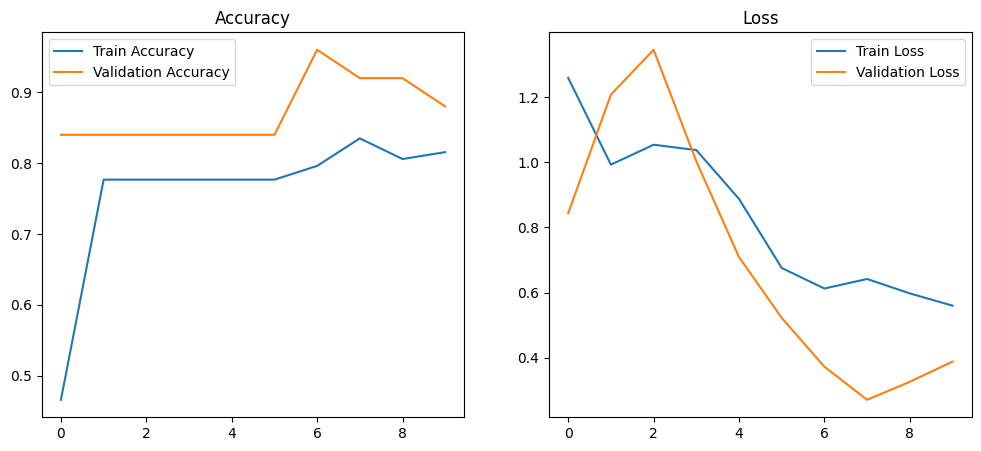

In [27]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')

plt.show()

Step6_Explanation: Step 6 compiles the Vision transformer model so it can start training. It uses the same settings as the other models: the optimiser, cross‑entropy loss, and accuracy as the metric. Compiling basically tells the model how to learn and how to measure its performance.

Step 7

In [28]:
def load_and_preprocess_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence


Step7_Explanation: During this step, the model learns to recognise patterns in the insect images by updating the weights in the classifier layer. The model goes through several epochs and reports the training and validation accuracy after each one.

Step 8

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


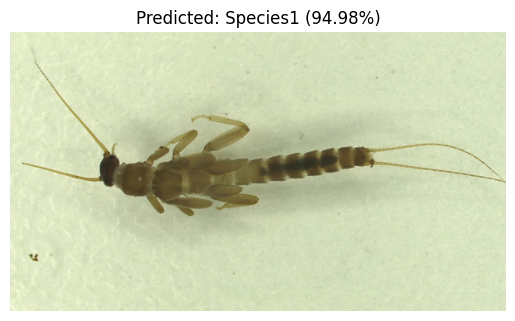

In [29]:
# === Example prediction ===
test_img_path = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/test_data/species1_2.png'

predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(tf.keras.preprocessing.image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence*100:.2f}%)')
plt.axis('off')
plt.show()

Step8_Explanation: Step 8 evaluates the Vision Transformer model on the validation dataset to see how well it performs after training. The model goes through all the validation images and calculates the final accuracy and loss, resulting in the overall measure of performance.

Step 9

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


<Figure size 1200x1200 with 0 Axes>

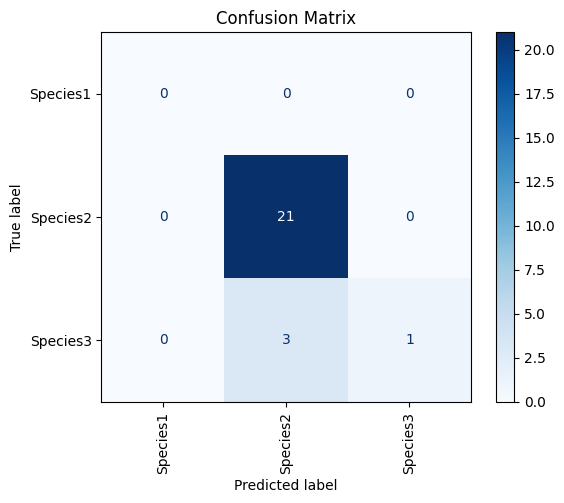

Precision: 0.8950
Recall:    0.8800
F1-score:  0.8480


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


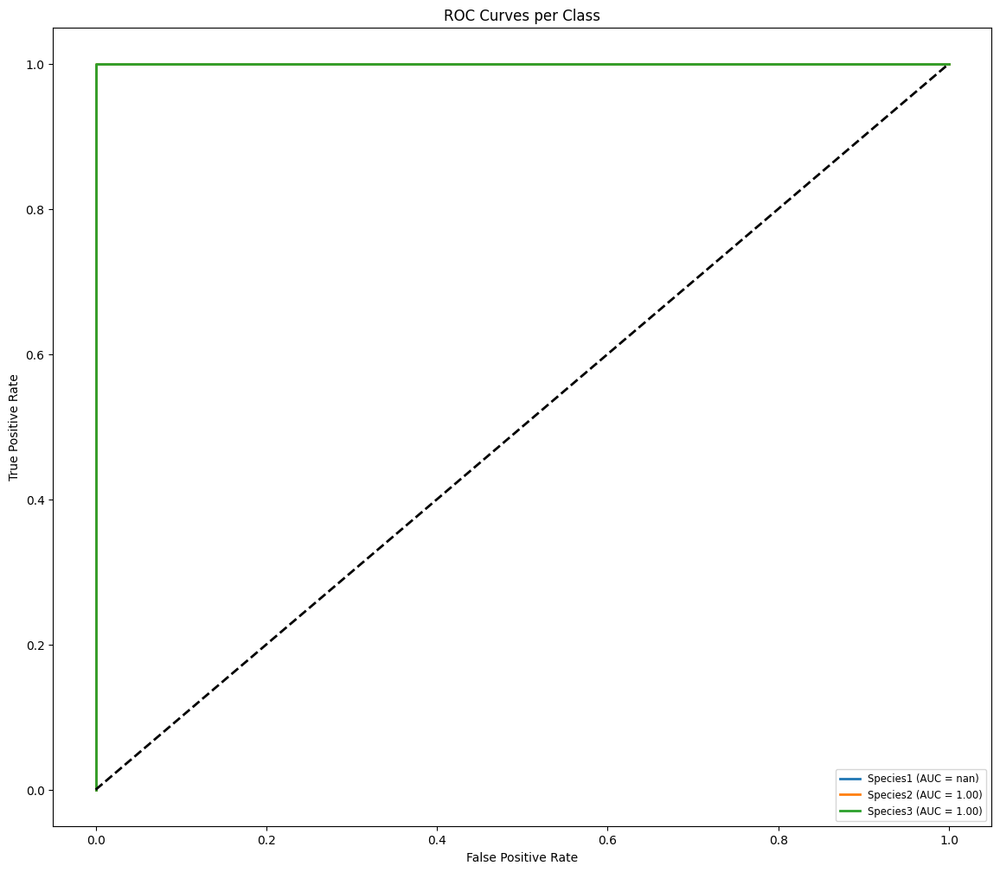

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred, labels=range(len(class_names)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()

Step9_Explanation: Step 9 is basically the same as in the previous models. It collects the true labels and predictions from the validation set, then generates the confusion matrix, and ROC curves. The only difference is that it uses the Vision Transformer’s predictions instead of MobileNet or EfficientNet



Step 12

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
Original Image: species1_1.png --> Predicted: Species1 (83.75%)


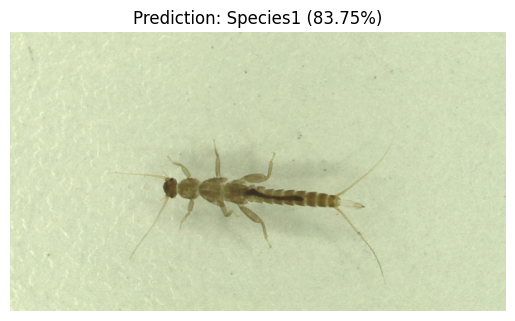

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
Original Image: species1_2.png --> Predicted: Species2 (49.89%)


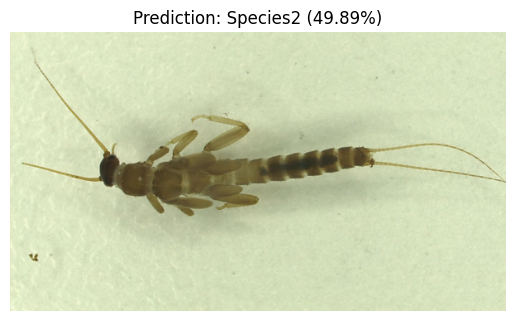

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: species1_3.png --> Predicted: Species1 (82.32%)


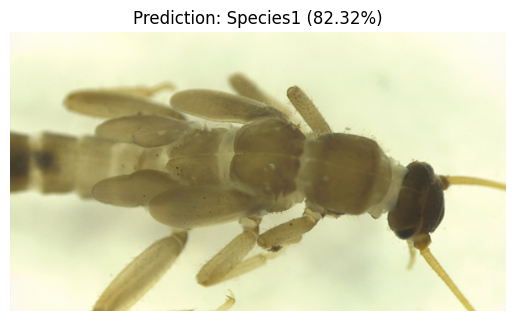

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Original Image: species1_4.png --> Predicted: Species1 (59.13%)


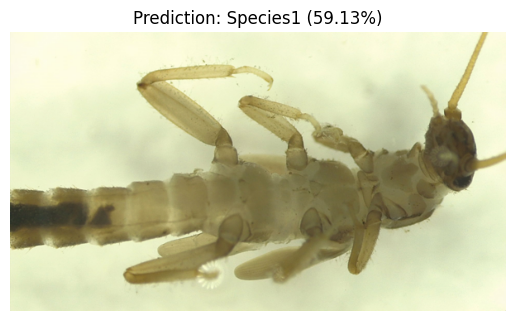

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Original Image: species1_5.png --> Predicted: Species1 (64.82%)


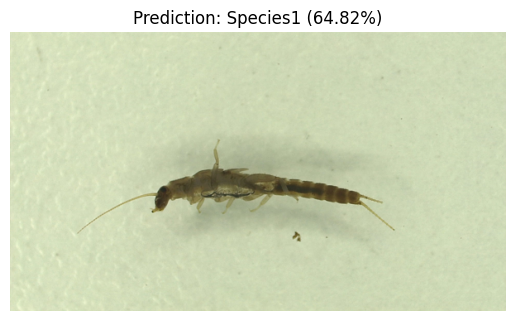

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Original Image: species2_1.png --> Predicted: Species2 (80.50%)


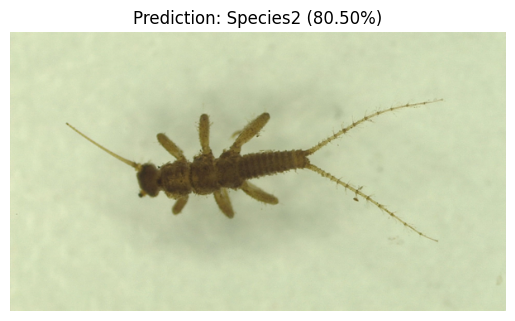

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step
Original Image: species2_2.png --> Predicted: Species2 (90.53%)


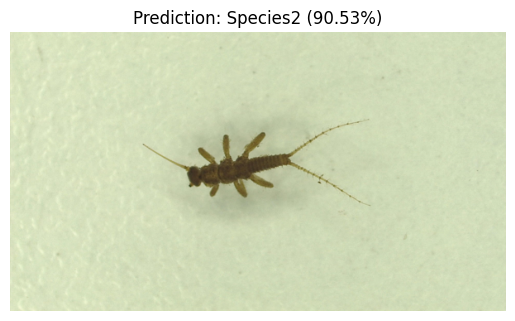

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
Original Image: species2_3.png --> Predicted: Species2 (89.48%)


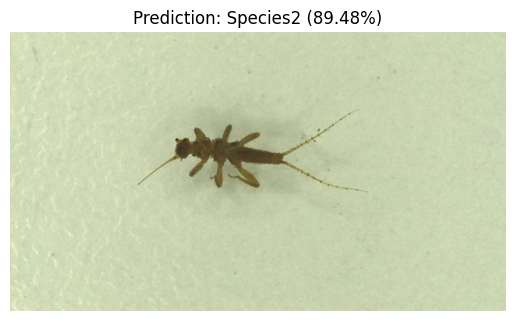

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step
Original Image: species2_4.png --> Predicted: Species2 (79.64%)


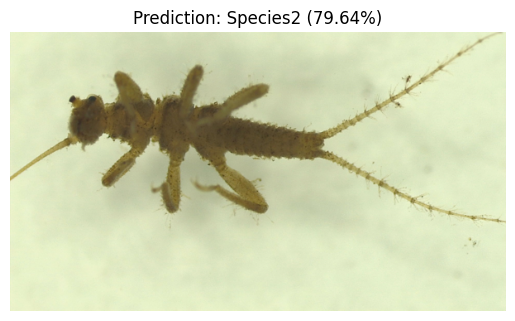

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step
Original Image: species2_5.png --> Predicted: Species2 (96.81%)


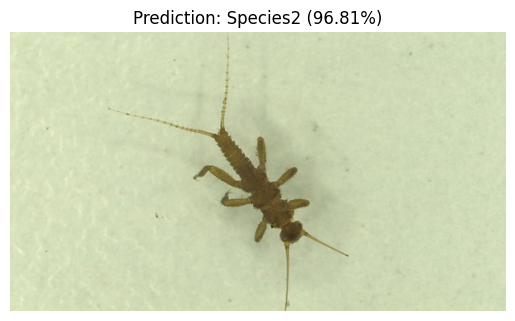

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step
Original Image: species3_1.png --> Predicted: Species3 (57.89%)


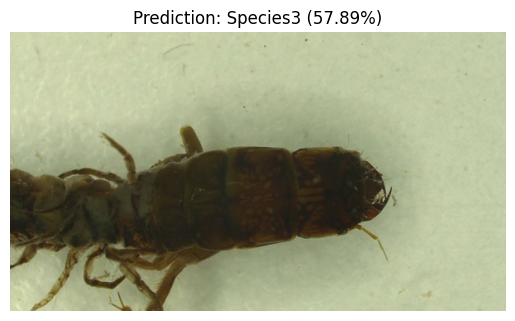

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
Original Image: species3_2.png --> Predicted: Species3 (66.78%)


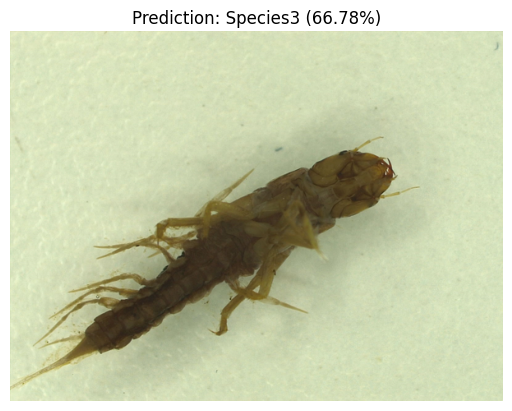

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step
Original Image: species3_3.png --> Predicted: Species3 (76.17%)


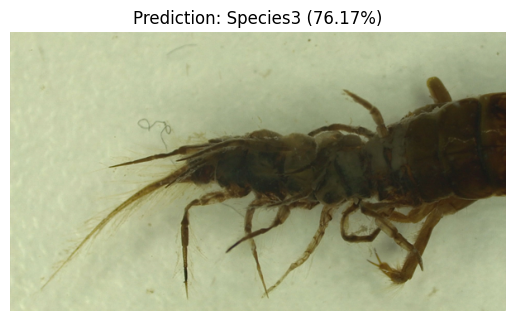

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: species3_4.png --> Predicted: Species3 (73.38%)


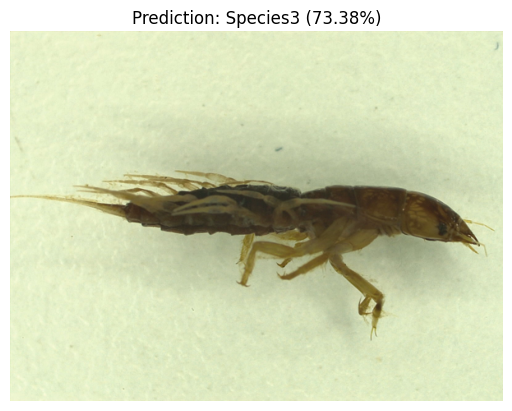

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: species3_5.png --> Predicted: Species3 (94.24%)


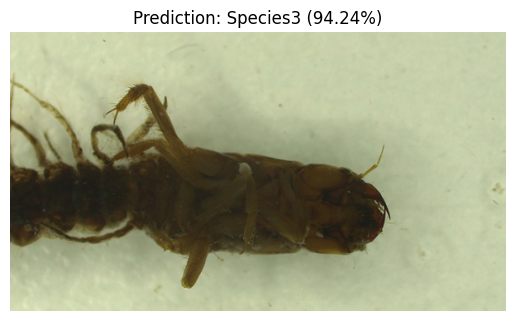

In [ ]:
#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/Wk 8 ST1 Tutorial and Computer Lab/Assets folder /insects dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

# Ensure IMG_SIZE is treated as a tuple for this function
_target_img_size = (IMG_SIZE, IMG_SIZE) if not isinstance(IMG_SIZE, tuple) else IMG_SIZE

def load_and_preprocess_image(img_path, img_size=_target_img_size):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)

Step12_Explanation: Step 12 is the same as in the previous models. It loads the test images, preprocesses them, and uses the trained vision transformer model to predict the insect species and confidence score.

**Evaluation Report:**

The week 8 tutorial activity compares the performance of three deep learning models - —MobileNetV2, EfficientNetB0, and the Vision Transformer. Their performance was assessed using confusion matrices, precision, recall, F1-scores and ROC curves.

Confusion Matric Analysis:

The confusion matrices presents differences in how each model handle classification across the insect classes. MobileNetV2 showed the highest level of confusion, with incorrect predictions between visually similar categories. EfficientNetB0 demonstrated stronger class separation, producing fewer misclassifications and a more structured matrix. The vision transformer presented the cleanest confusion matrix, but showed misclassifications, particularly between species 2 and 3. Overall, EfficientNet displayed the most consistent and accurate class‑level predictions.

Precision, Recall, and F1-Score Comparison:

The precision, recall, and F1‑scores provide a deeper understanding of each model’s reliability. MobileNetV2 achieved perfect precision (1.0000) but lower recall (0.8800), resulting in an F1‑score of 0.9262. EfficientNetB0 delivered the strongest and most balanced performance, achieving precision of 1.0000, recall of 0.9600, and the highest F1‑score of 0.9795, indicating excellent generalisation. The Vision Transformer achieved lower precision (0.8950) and recall (0.8800), resulting in the lowest F1‑score (0.8480), reflecting less consistent performance


ROC Curve Comparison:

The ROC curves illustrates each model’s ability to distinguish between classes. MobileNetV2 produced acceptable curves but with noticeable variability across classes. EfficientNetB0 showed smoother ROC curves, indicating more stable and confident predictions. The vison transformer achieved the strongest performance level, but failed to seperate species 1 - not able to distinguish all classes. Overall, EfficientNetB0 demonstrated the most reliable and consistent class separation.


Overall Conclusion:

EfficientNetB0 outperformed both MobileNetV2 and the Vision Transformer. It delivered the strongest balance of accuracy, generalisation, and class separation. EfficientNetB0 is suitable model for deployment, offering the highest and most consistent performance.

